# Introduction
We've received Scintillators from [Alexander Gektins group](http://isma.kharkov.ua/eng/).
According to Alexander, they are

> composite scintillator[s] on the base of the same CsI(Tl) or CsI(Na).
> It looks like a thin film made from optical (gel matrix) uploaded with scintillator (in your case it is CsI) powder.

These scintillators have been assessed with a classic [x-ray setup](https://www.psi.ch/bz/infrastruktur) (Varian RAD 14 source) at the [PSI radiation safety school](https://www.psi.ch/bz/schule-fuer-strahlenschutz).

The [iPython notebook](http://jupyter.org/) here shows the comparison of the different ISMA scintillators with a [classic CsI:Tl scintillator, commercially available from Toshiba](http://drive.globaldiagnostix.org/index.php/s/5gk1jXxG3M4yKEV).

# Materials & Methods
First we have to import some libraries we need and set some sensible defaults for outputting the plots.

In [1]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy
import os
import platform
import glob

# Display defaults
matplotlib.style.use('ggplot')  # Use ggplot style for plots
%matplotlib inline
plt.rc('image', cmap='gray', interpolation='nearest')  # Display all images the same way
plt.rcParams['figure.figsize'] = (16 * 0.8, 9 * 0.8)  # Display images in this size
plt.rc('lines', linewidth=2)  # Make lines a bit wider
plt.rc('lines', marker='o')  # Always with line markers
# Colors from http://tools.medialab.sciences-po.fr/iwanthue/
colors = ["#CC5B9B", "#6FAB4C", "#7889C6", "#CC6D39"]

Then we define often used functions, namely for reading the images from the [GDX](http://globaldiagnostix.org/) prototype electronics which we used for this experiment.

In [2]:
# Functions
def read_gray(filename, width=1280, height=4*1024):
    '''Read a .gray image from the detector to a numpy array, ready to display'''
    image = numpy.fromfile(filename, dtype=numpy.int16, count=-1, sep='').reshape(height, width)
    return image

def reslice_image(inputimagename, ImageWidth=1280, ImageHeight=4*1024, read=True):
    '''Display 4sensor image in "human-readable" format'''
    if read:
        # Read the image from disk
        img = read_gray(inputimagename, width=ImageWidth, height=ImageHeight)
    else:
        # We already have an image, just reslice it
        img = inputimagename
    # Split into top and bottom, which we concatenate afterwards
    bottom = numpy.concatenate((img[0 * ImageHeight / 4:(0 + 1) * ImageHeight / 4, :],
                                img[1 * ImageHeight / 4:(1 + 1) * ImageHeight / 4, :]),
                               axis=1)
    top = numpy.concatenate((img[2 * ImageHeight / 4:(2 + 1) * ImageHeight / 4, :],
                             img[3 * ImageHeight / 4:(3 + 1) * ImageHeight / 4, :]),
                            axis=1)
    concatenate = numpy.concatenate((top, bottom), axis=0)
    return concatenate

def show_single_cmos(inputimagename, sensor=1, reslice=False):
    '''Display only one CMOS from 4sensor image'''
    if sensor not in [1,2,3,4]:
        print 'You have to give me a CMOS number from 1 to 4'
    if reslice:
        # We already have a full image, slice it again
        img = numpy.concatenate((inputimagename[1024:,:1280], inputimagename[1024:,1280:],
                                 inputimagename[:1024,:1280], inputimagename[:1024,1280:]))
    else:
        img = read_gray(inputimagename)     
    # Return only once CMOS region
    img = img[(sensor - 1) * 1024:sensor * 1024, :]
    return img

def display_roi(image, ZoomStartX=650, ZoomStartY=900, ZoomSize=200, color='red', prefix=''):
    '''Display an image with ROI of zoomed region plus the zoomed region'''
    # Show image
    plt.imshow(image)
    if prefix:
        plt.title('%s: Region of ROI with a size of %s px' % (prefix, ZoomSize))
    else:
        plt.title('Region of ROI with a size of %s px' % ZoomSize)        
    # Overlay zoom ROI on original image
    currentAxis = plt.gca()
    currentAxis.add_patch(Rectangle((ZoomStartX, ZoomStartY), ZoomSize, ZoomSize, fc=color, ec='k', alpha=0.309))
    # Return ROI image
    roi = image[ZoomStartY:ZoomStartY + ZoomSize, ZoomStartX:ZoomStartX + ZoomSize]
    return roi

After having done that, we actually perform the analysis.
To do so, we
- go through the folders (their name either contains `gkt_sct` or `gkt_gkt` for images with the Toshiba scintillator or the ISMA scintillators, respectively).
- load the images for equal source settings (`timestamp_scintillator_kV_mA`)
- define a ROI for the scintillator in question (empirically)
- plot the mean brightness and standard deviation

In [3]:
# Load images
if 'anomalocaris' in platform.node():
    # If we work locally on the Mac, load the local files
    StartPath = '/Users/habi/Dev/DemonstratorElectronics/detector2'
else:
    # Otherwise, load the files from AFS
    StartPath = '/afs/psi.ch/project/EssentialMed/Images/detector2/leadglass'
# Find all experiment folders
Folders = glob.glob(os.path.join(StartPath, '*gkt_gkt2_*_*'))

In [4]:
# Display and save kV and mA parameters (mAs is in the log files, we don't  parse them...)
kV = [None] * len(Folders)
mA = [None] * len(Folders)
for c,i in enumerate(Folders):
    kV[c] = int(i.split('_')[3])
    mA[c] = int(i.split('_')[4])
    print 'Experiment "%s" was acquired with %s kV and %s mA' % (os.path.basename(i), kV[c], mA[c])

Experiment "1460728181_gkt_gkt2_40_40" was acquired with 40 kV and 40 mA
Experiment "1460728231_gkt_gkt2_50_40" was acquired with 50 kV and 40 mA
Experiment "1460728271_gkt_gkt2_60_32" was acquired with 60 kV and 32 mA
Experiment "1460728304_gkt_gkt2_60_32" was acquired with 60 kV and 32 mA
Experiment "1460728381_gkt_gkt2_70_32" was acquired with 70 kV and 32 mA
Experiment "1460728431_gkt_gkt2_81_10" was acquired with 81 kV and 10 mA
Experiment "1460728487_gkt_gkt2_60_32" was acquired with 60 kV and 32 mA
Experiment "1460728520_gkt_gkt2_70_32" was acquired with 70 kV and 32 mA
Experiment "1460728559_gkt_gkt2_81_10" was acquired with 81 kV and 10 mA
Experiment "1460728608_gkt_gkt2_109_10" was acquired with 109 kV and 10 mA
Experiment "1460728654_gkt_gkt2_46_2" was acquired with 46 kV and 2 mA
Experiment "1460728699_gkt_gkt2_46_2" was acquired with 46 kV and 2 mA
Experiment "1460728735_gkt_gkt2_46_4" was acquired with 46 kV and 4 mA


--------------------------------------------------------------------------------
1/13: 1460728181_gkt_gkt2_40_40


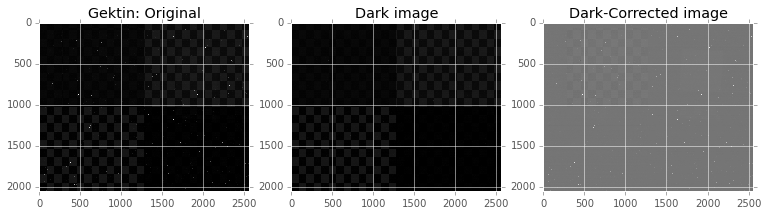

The corresponding folder for the Toshiba scintillator is 1460725350_gkt_sct_40_40


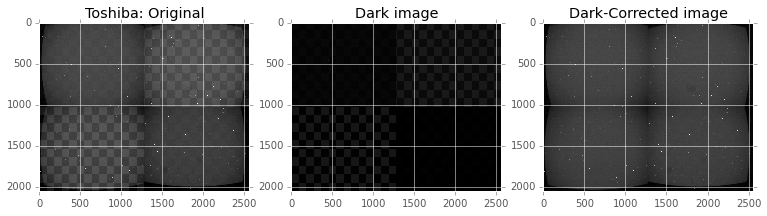

--------------------------------------------------------------------------------
2/13: 1460728231_gkt_gkt2_50_40


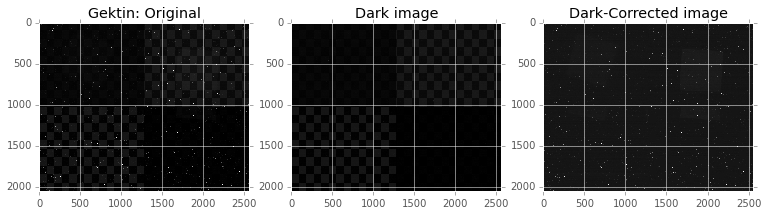

The corresponding folder for the Toshiba scintillator is 1460725409_gkt_sct_50_40


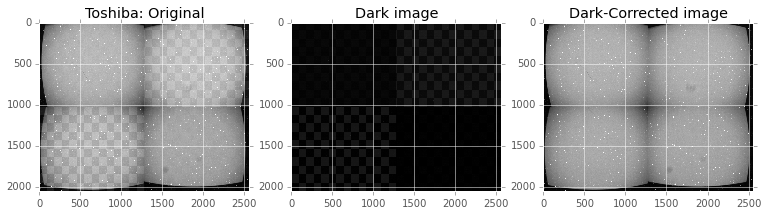

--------------------------------------------------------------------------------
3/13: 1460728271_gkt_gkt2_60_32


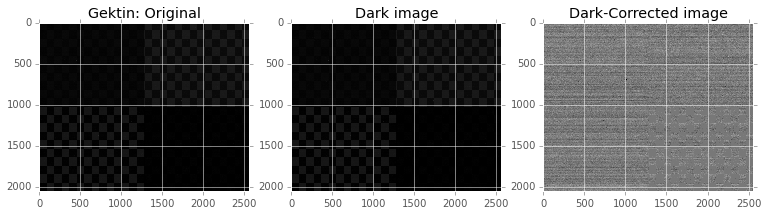

The corresponding folder for the Toshiba scintillator is 1460725577_gkt_sct_60_32


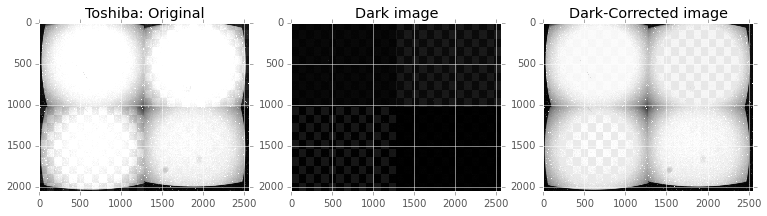

--------------------------------------------------------------------------------
4/13: 1460728304_gkt_gkt2_60_32


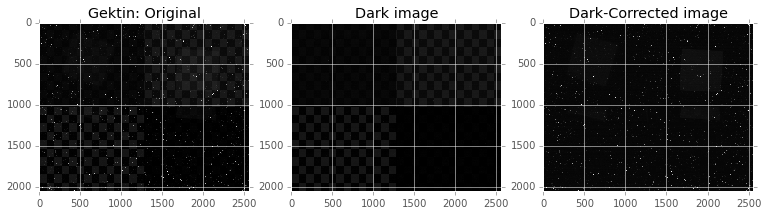

The corresponding folder for the Toshiba scintillator is 1460725577_gkt_sct_60_32


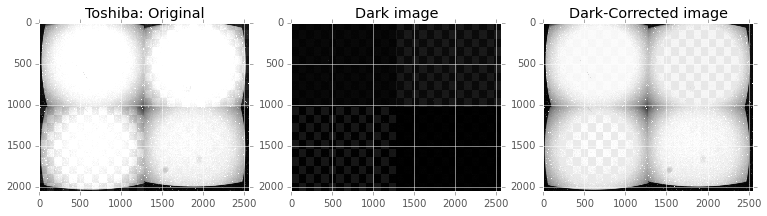

--------------------------------------------------------------------------------
5/13: 1460728381_gkt_gkt2_70_32


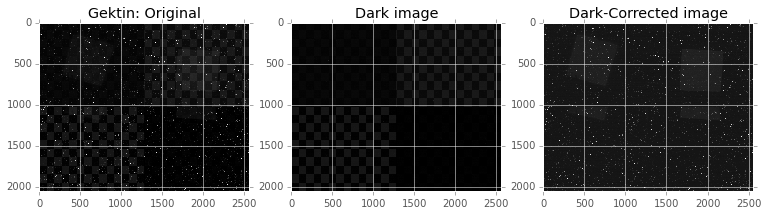

The corresponding folder for the Toshiba scintillator is 1460725705_gkt_sct_70_32


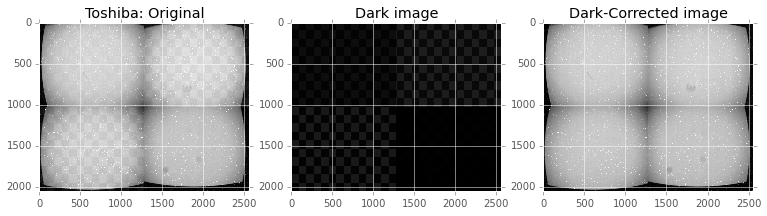

--------------------------------------------------------------------------------
6/13: 1460728431_gkt_gkt2_81_10


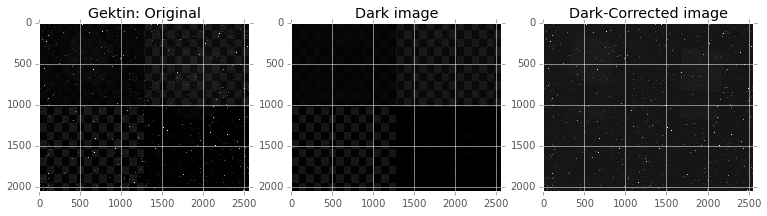

The corresponding folder for the Toshiba scintillator is 1460725818_gkt_sct_81_10


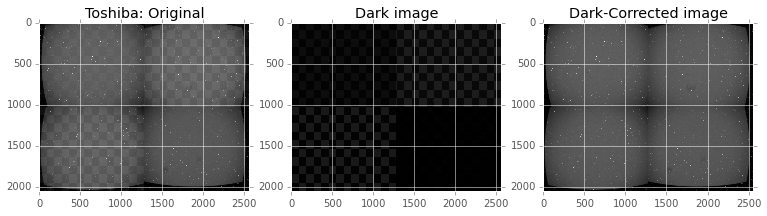

--------------------------------------------------------------------------------
7/13: 1460728487_gkt_gkt2_60_32


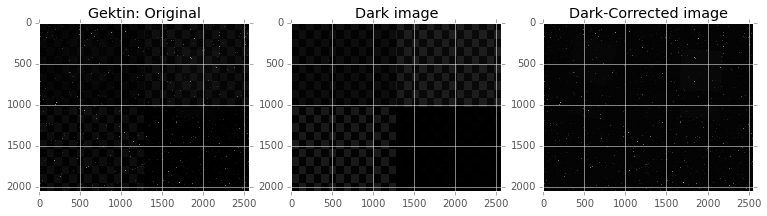

The corresponding folder for the Toshiba scintillator is 1460725577_gkt_sct_60_32


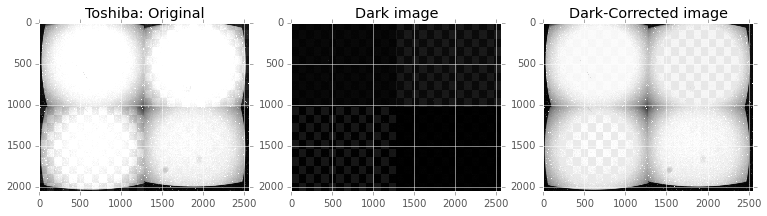

--------------------------------------------------------------------------------
8/13: 1460728520_gkt_gkt2_70_32


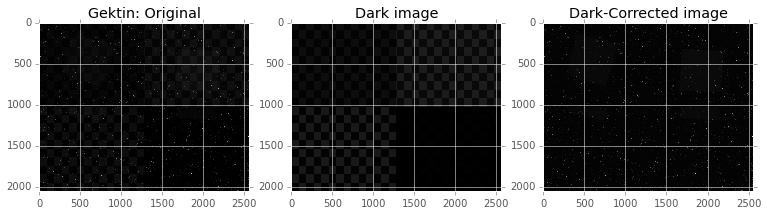

The corresponding folder for the Toshiba scintillator is 1460725705_gkt_sct_70_32


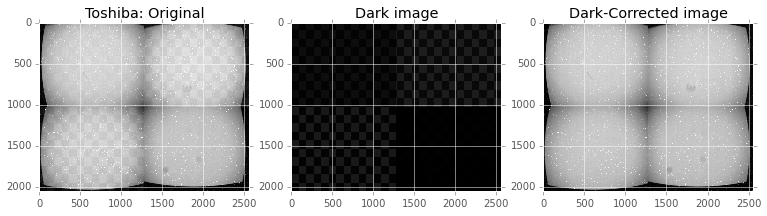

--------------------------------------------------------------------------------
9/13: 1460728559_gkt_gkt2_81_10


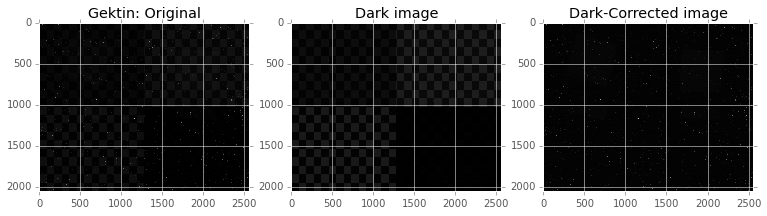

The corresponding folder for the Toshiba scintillator is 1460725818_gkt_sct_81_10


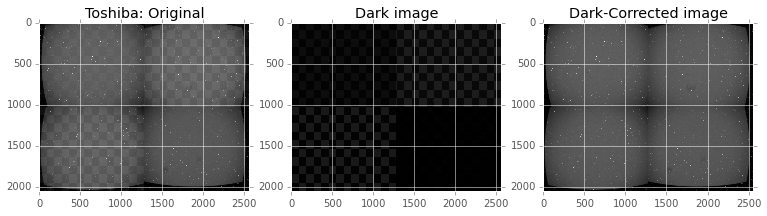

--------------------------------------------------------------------------------
10/13: 1460728608_gkt_gkt2_109_10


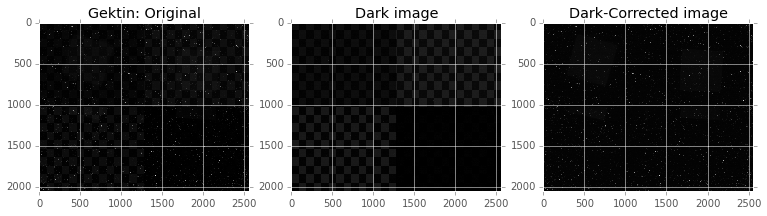

The corresponding folder for the Toshiba scintillator is 1460726461_gkt_sct_109_10


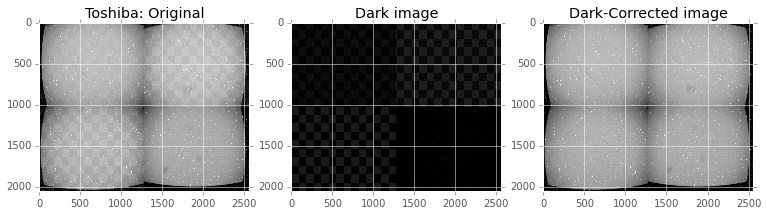

--------------------------------------------------------------------------------
11/13: 1460728654_gkt_gkt2_46_2


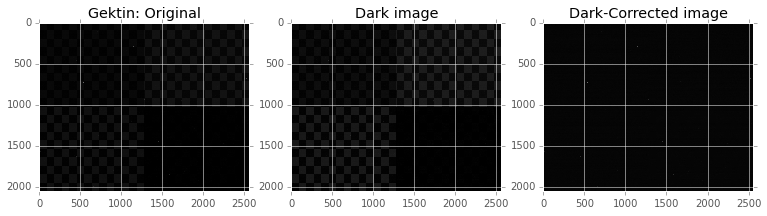

The corresponding folder for the Toshiba scintillator is 1460726512_gkt_sct_46_2


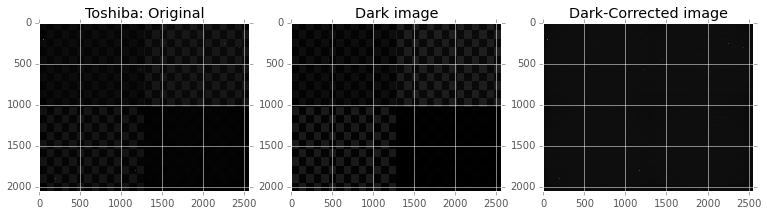

--------------------------------------------------------------------------------
12/13: 1460728699_gkt_gkt2_46_2


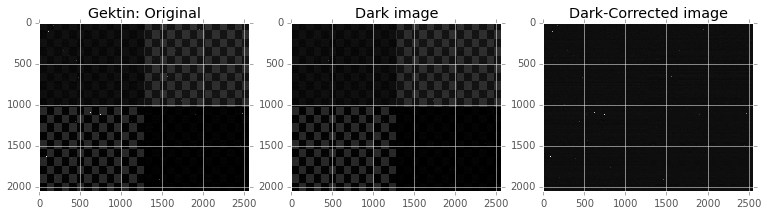

The corresponding folder for the Toshiba scintillator is 1460726512_gkt_sct_46_2


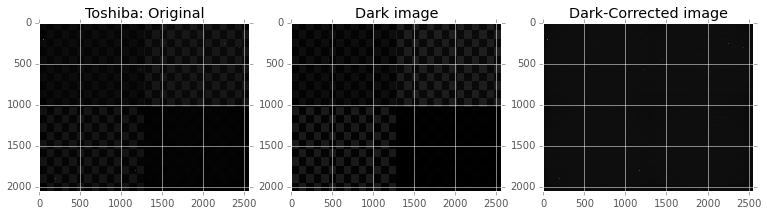

--------------------------------------------------------------------------------
13/13: 1460728735_gkt_gkt2_46_4


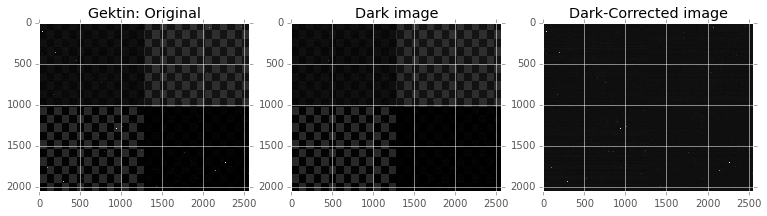

The corresponding folder for the Toshiba scintillator is 1460726627_gkt_sct_46_4_phantom


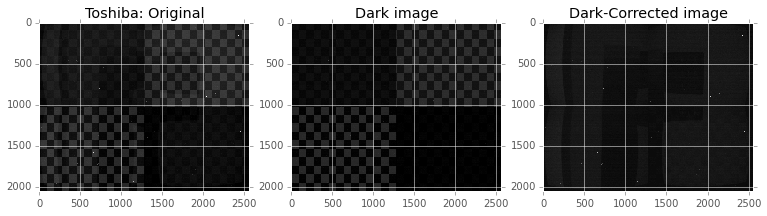

In [5]:
# Load all images
gkt_Image = [None] * len(Folders)
gkt_Dark = [None] * len(Folders)
gkt_Corrected = [None] * len(Folders)
sct_Image = [None] * len(Folders)
sct_Dark = [None] * len(Folders)
sct_Corrected = [None] * len(Folders)

for c, i in enumerate(Folders):
    print 80 * '-'
    print '%s/%s: %s' % (c + 1, len(Folders), os.path.basename(i))
    # Load images from Gektin
    Images = glob.glob(os.path.join(i, '*.gray'))
    # Perform dark-correction
    gkt_Image[c] = reslice_image(Images[0])
    gkt_Dark[c] =  reslice_image(Images[1])
    gkt_Corrected[c] = numpy.subtract(gkt_Image[c], gkt_Dark[c])
    plt.subplot(131)
    plt.imshow(gkt_Image[c])
    plt.title('Gektin: Original')
    plt.subplot(132)
    plt.title('Dark image')
    plt.imshow(gkt_Dark[c])
    plt.subplot(133)
    plt.imshow(gkt_Corrected[c])
    plt.title('Dark-Corrected image')
    plt.show()

    # Find folder with equal settings from Toshiba scintillator
    print 'The corresponding folder for the Toshiba scintillator is %s' % os.path.basename(glob.glob(os.path.join(StartPath, '*sct_%s_%s*' % (kV[c], mA[c])))[0])
    # Then load and display this image
    ToshibaFiles = glob.glob(os.path.join(StartPath, '*sct_%s_%s*' % (kV[c], mA[c]), '*.gray'))
    sct_Image[c] = reslice_image(ToshibaFiles[0])
    sct_Dark[c] =  reslice_image(ToshibaFiles[1])
    sct_Corrected[c] = numpy.subtract(sct_Image[c], sct_Dark[c])
    plt.subplot(131)
    plt.imshow(sct_Image[c])
    plt.title('Toshiba: Original')
    plt.subplot(132)
    plt.title('Dark image')
    plt.imshow(sct_Dark[c])
    plt.subplot(133)
    plt.imshow(sct_Corrected[c])
    plt.title('Dark-Corrected image')
    plt.show()

--------------------------------------------------------------------------------
Reading ROIs from folder 1460728181_gkt_gkt2_40_40


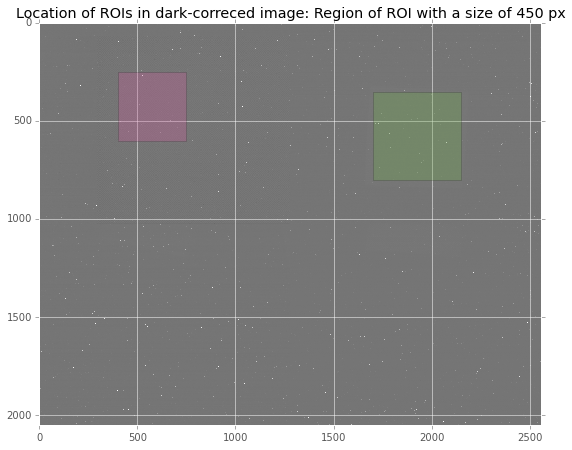

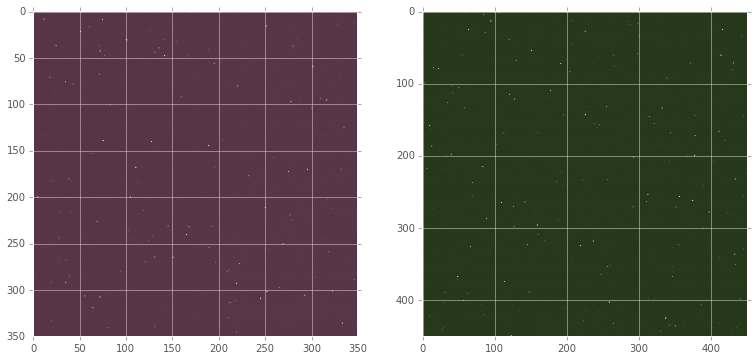

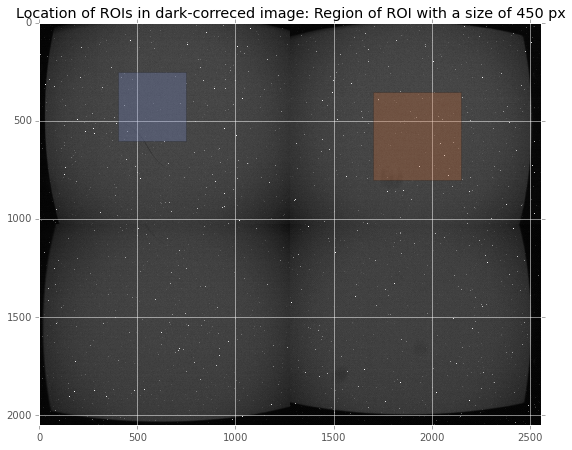

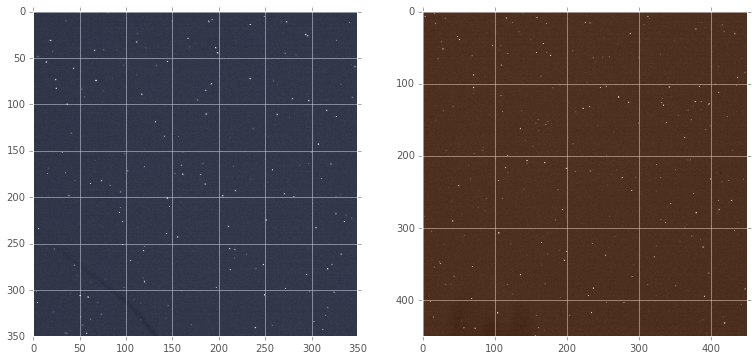

For 1460728181_gkt_gkt2_40_40,
the mean brightness for the ROI of 
	Scintillator 107 is 59.31x brighter on the Toshiba vs. the ISMA scintillator (269 vs. 5, respectively)
	Scintillator 109 is 19.53x brighter on the Toshiba vs. the ISMA scintillator (269 vs. 14, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 1.04x smaller on the Toshiba vs. the ISMA scintillator (21 vs. 22, respectively)
	Scintillator 109 is 0.85x smaller on the Toshiba vs. the ISMA scintillator (21 vs. 18, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728231_gkt_gkt2_50_40


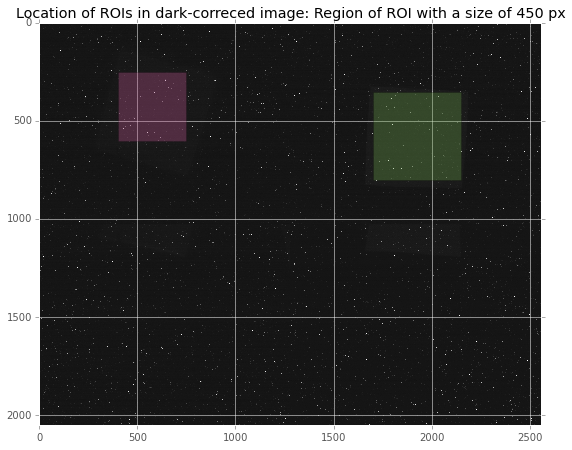

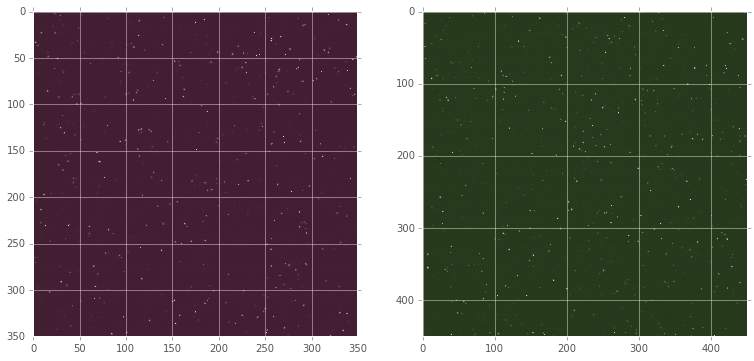

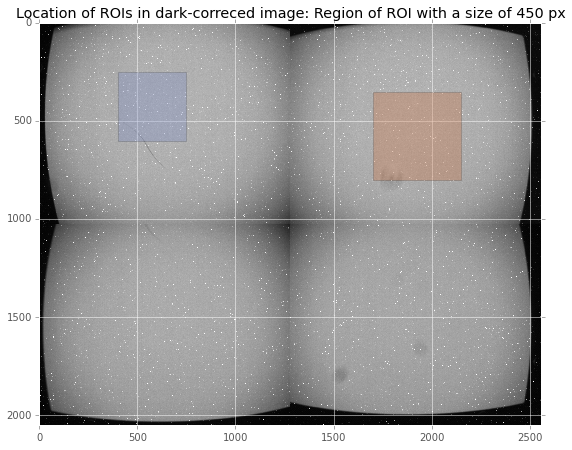

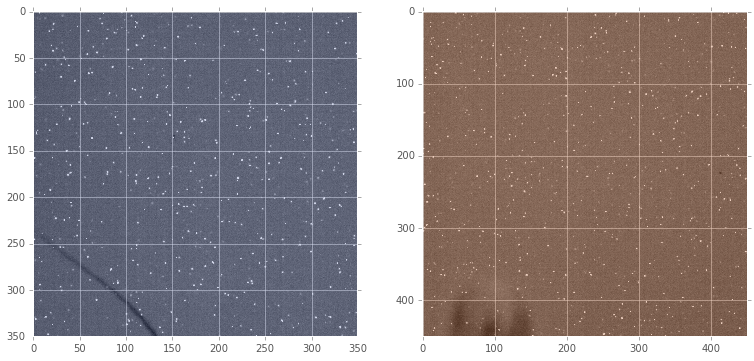

For 1460728231_gkt_gkt2_50_40,
the mean brightness for the ROI of 
	Scintillator 107 is 41.17x brighter on the Toshiba vs. the ISMA scintillator (710 vs. 17, respectively)
	Scintillator 109 is 23.37x brighter on the Toshiba vs. the ISMA scintillator (707 vs. 30, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 1.11x smaller on the Toshiba vs. the ISMA scintillator (28 vs. 31, respectively)
	Scintillator 109 is 1.15x smaller on the Toshiba vs. the ISMA scintillator (27 vs. 31, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728271_gkt_gkt2_60_32


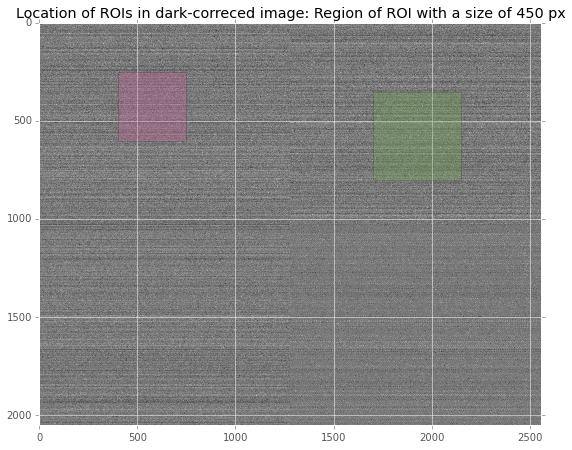

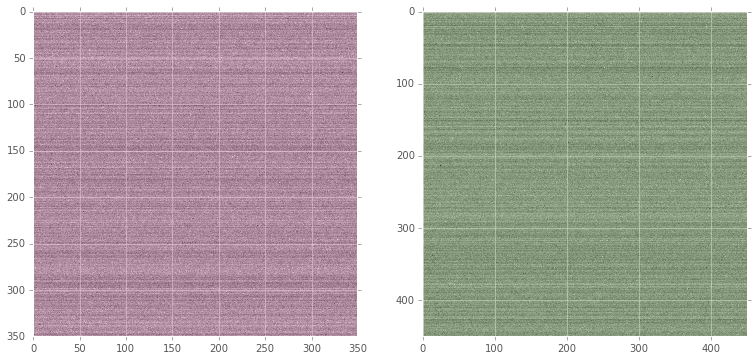

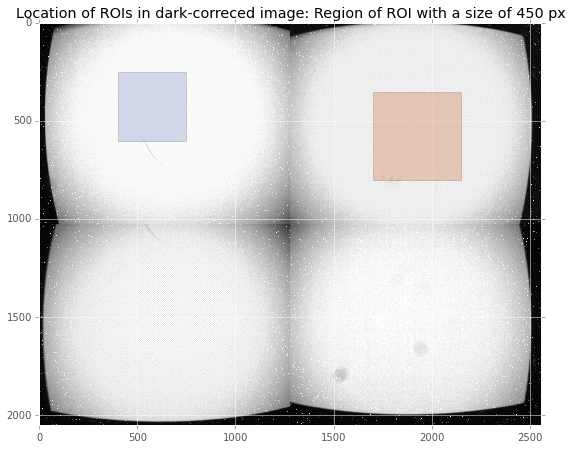

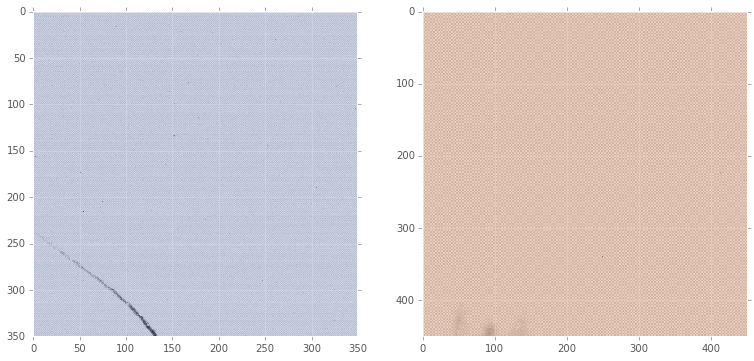

For 1460728271_gkt_gkt2_60_32,
the mean brightness for the ROI of 
	Scintillator 107 is 2724.00x brighter on the Toshiba vs. the ISMA scintillator (997 vs. 0, respectively)
	Scintillator 109 is 2193.42x brighter on the Toshiba vs. the ISMA scintillator (952 vs. 0, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 0.39x smaller on the Toshiba vs. the ISMA scintillator (9 vs. 3, respectively)
	Scintillator 109 is 0.12x smaller on the Toshiba vs. the ISMA scintillator (29 vs. 3, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728304_gkt_gkt2_60_32


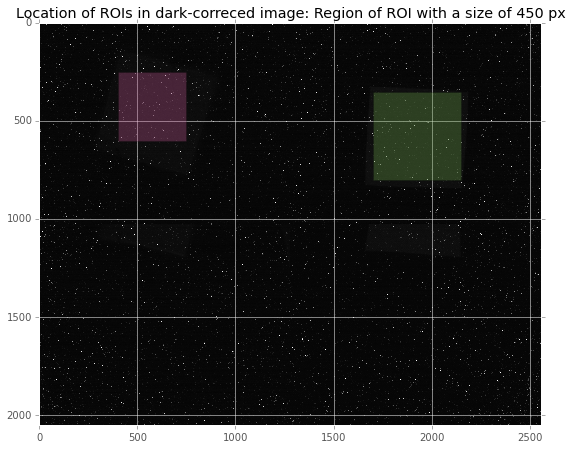

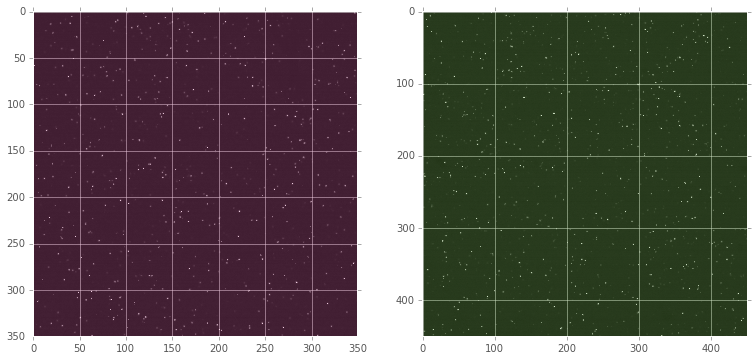

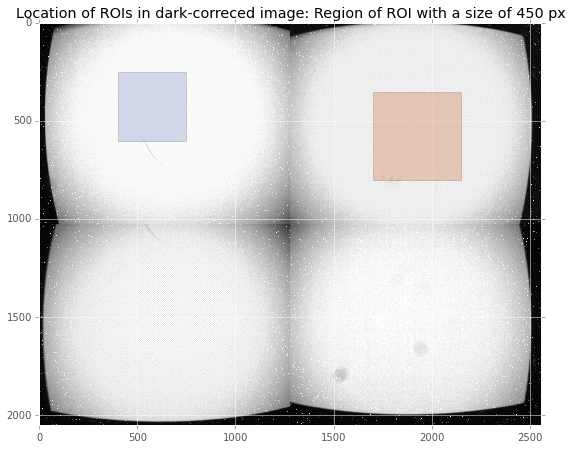

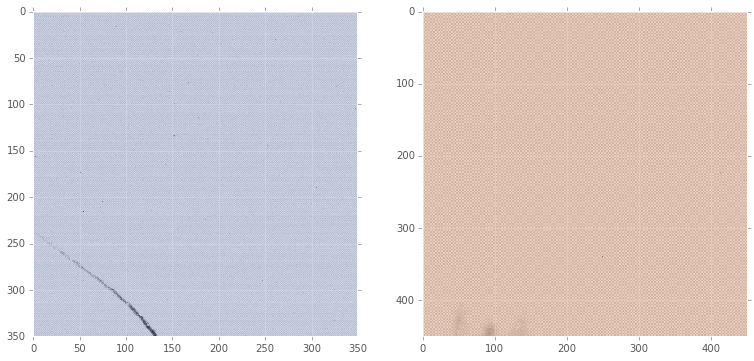

For 1460728304_gkt_gkt2_60_32,
the mean brightness for the ROI of 
	Scintillator 107 is 33.48x brighter on the Toshiba vs. the ISMA scintillator (997 vs. 30, respectively)
	Scintillator 109 is 23.13x brighter on the Toshiba vs. the ISMA scintillator (952 vs. 41, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 4.44x smaller on the Toshiba vs. the ISMA scintillator (9 vs. 39, respectively)
	Scintillator 109 is 1.37x smaller on the Toshiba vs. the ISMA scintillator (29 vs. 40, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728381_gkt_gkt2_70_32


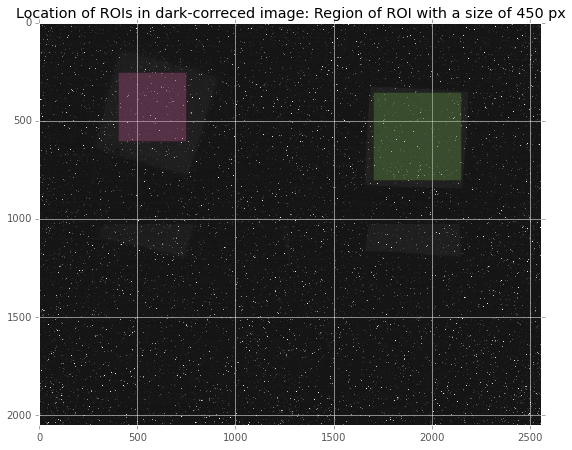

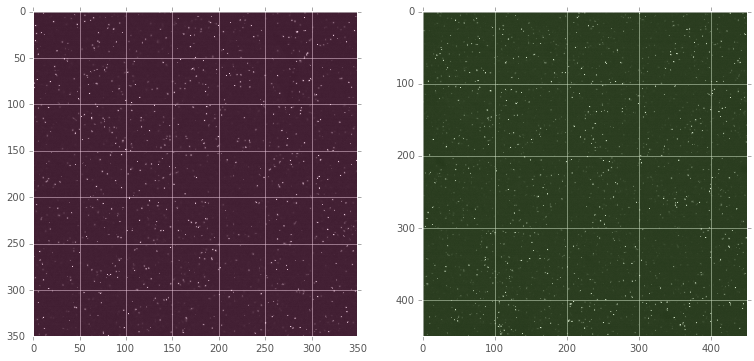

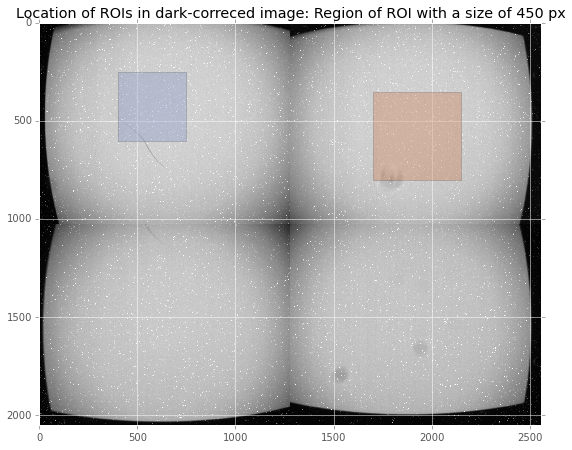

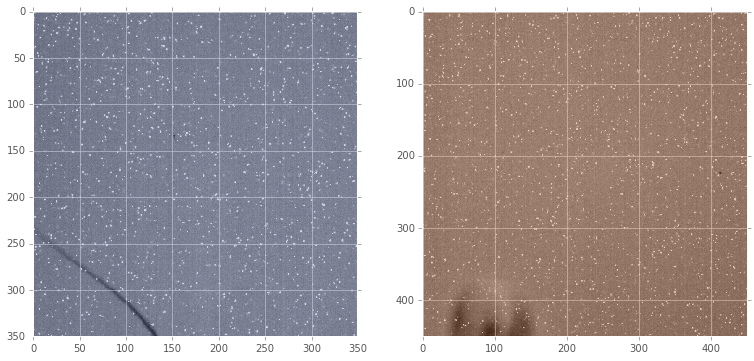

For 1460728381_gkt_gkt2_70_32,
the mean brightness for the ROI of 
	Scintillator 107 is 16.15x brighter on the Toshiba vs. the ISMA scintillator (839 vs. 52, respectively)
	Scintillator 109 is 13.45x brighter on the Toshiba vs. the ISMA scintillator (835 vs. 62, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 2.02x smaller on the Toshiba vs. the ISMA scintillator (26 vs. 52, respectively)
	Scintillator 109 is 1.94x smaller on the Toshiba vs. the ISMA scintillator (26 vs. 49, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728431_gkt_gkt2_81_10


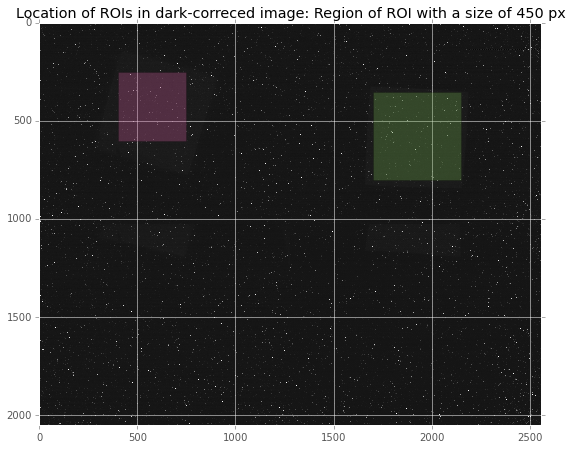

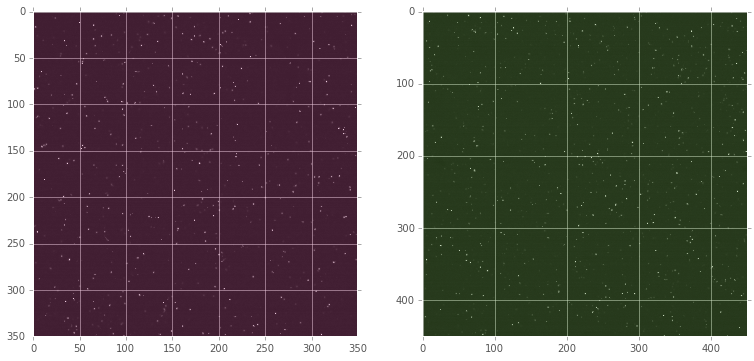

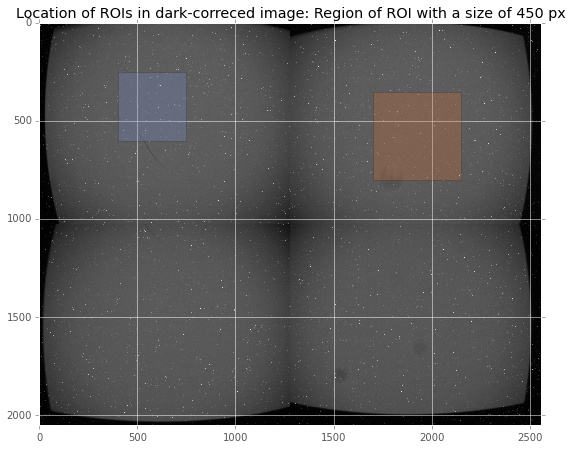

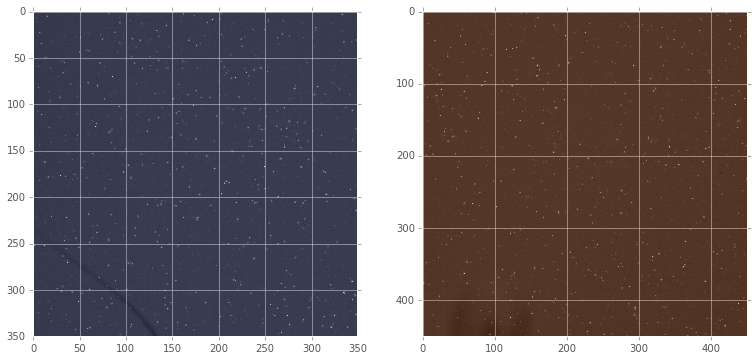

For 1460728431_gkt_gkt2_81_10,
the mean brightness for the ROI of 
	Scintillator 107 is 14.27x brighter on the Toshiba vs. the ISMA scintillator (378 vs. 26, respectively)
	Scintillator 109 is 13.74x brighter on the Toshiba vs. the ISMA scintillator (376 vs. 27, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 1.61x smaller on the Toshiba vs. the ISMA scintillator (22 vs. 36, respectively)
	Scintillator 109 is 1.62x smaller on the Toshiba vs. the ISMA scintillator (22 vs. 35, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728487_gkt_gkt2_60_32


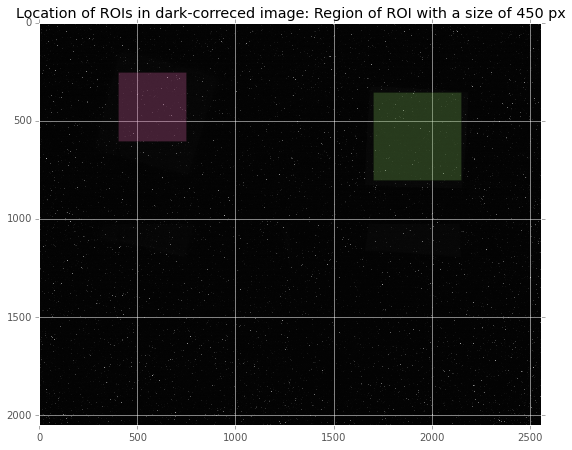

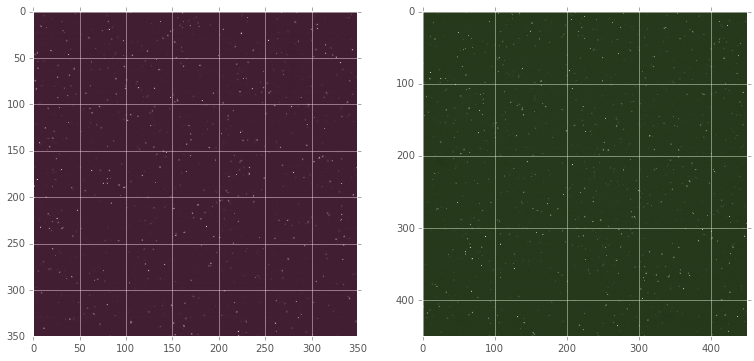

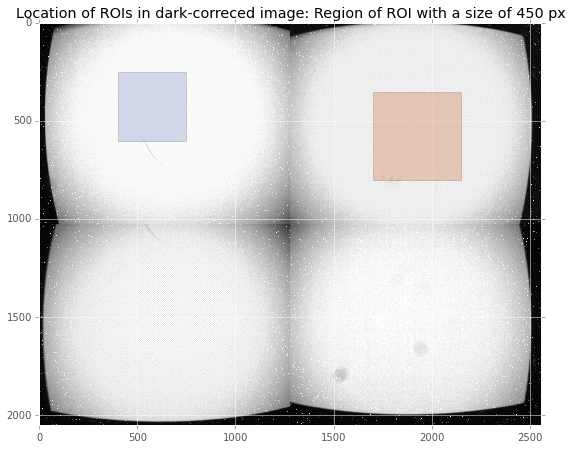

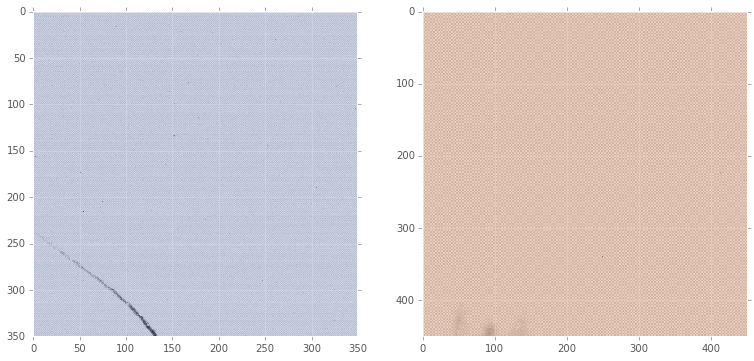

For 1460728487_gkt_gkt2_60_32,
the mean brightness for the ROI of 
	Scintillator 107 is 67.46x brighter on the Toshiba vs. the ISMA scintillator (997 vs. 15, respectively)
	Scintillator 109 is 46.00x brighter on the Toshiba vs. the ISMA scintillator (952 vs. 21, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 2.20x smaller on the Toshiba vs. the ISMA scintillator (9 vs. 19, respectively)
	Scintillator 109 is 0.67x smaller on the Toshiba vs. the ISMA scintillator (29 vs. 20, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728520_gkt_gkt2_70_32


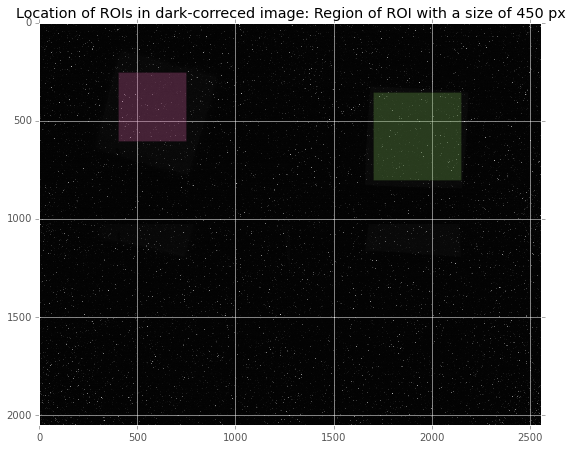

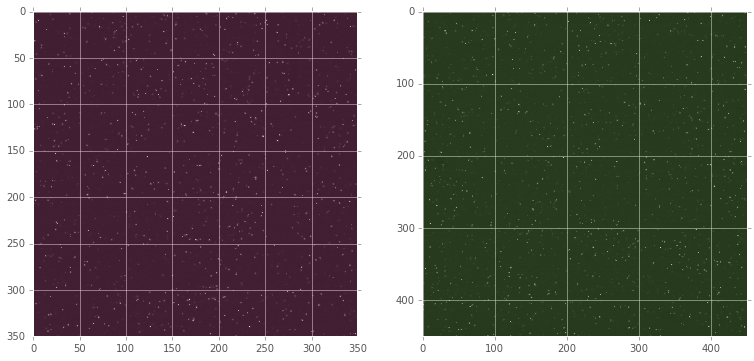

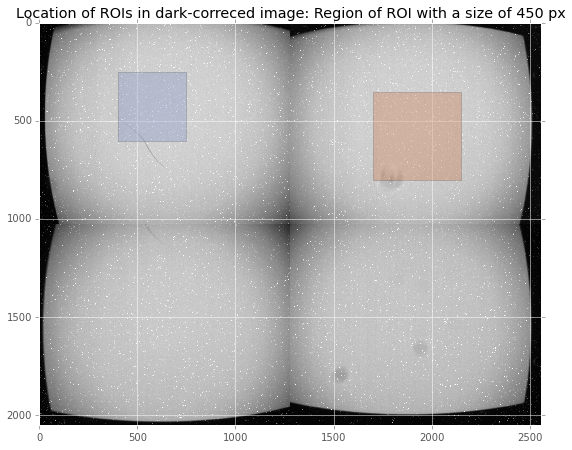

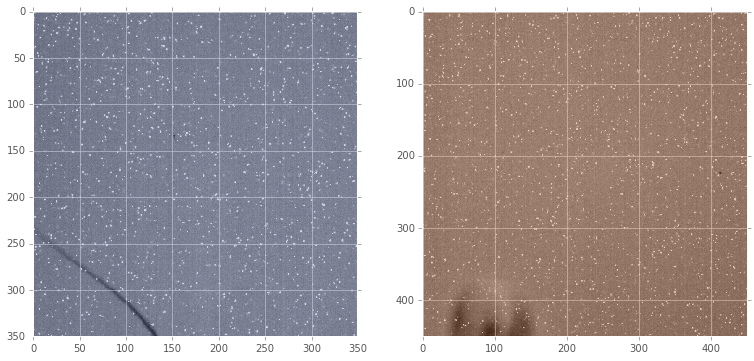

For 1460728520_gkt_gkt2_70_32,
the mean brightness for the ROI of 
	Scintillator 107 is 32.13x brighter on the Toshiba vs. the ISMA scintillator (839 vs. 26, respectively)
	Scintillator 109 is 26.84x brighter on the Toshiba vs. the ISMA scintillator (835 vs. 31, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 1.04x smaller on the Toshiba vs. the ISMA scintillator (26 vs. 27, respectively)
	Scintillator 109 is 1.03x smaller on the Toshiba vs. the ISMA scintillator (26 vs. 26, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728559_gkt_gkt2_81_10


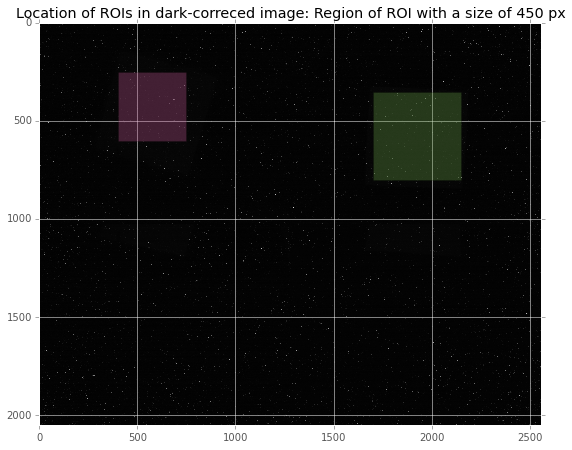

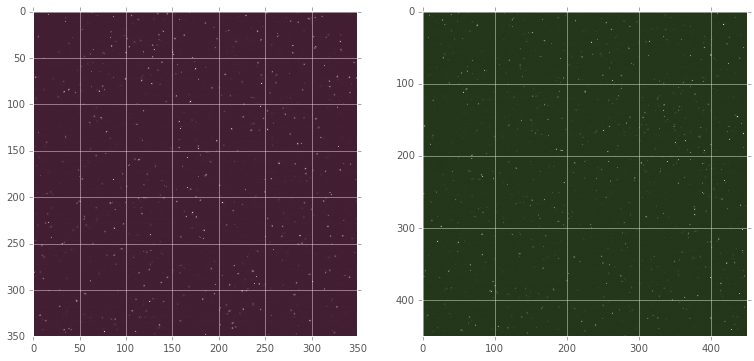

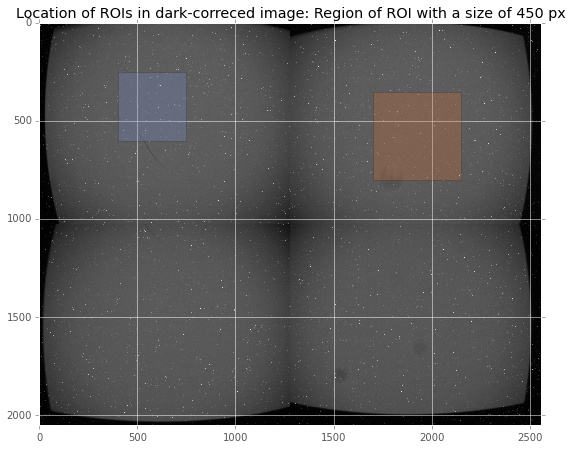

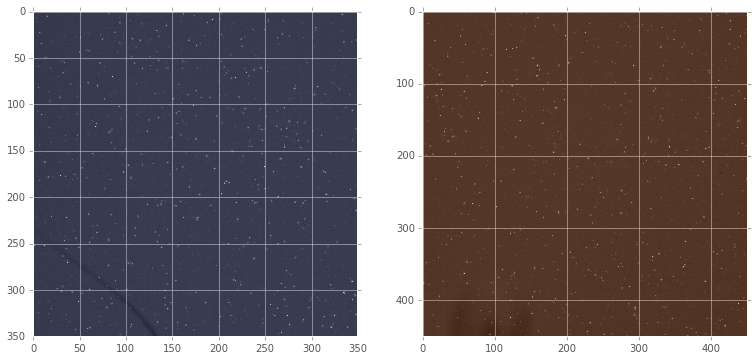

For 1460728559_gkt_gkt2_81_10,
the mean brightness for the ROI of 
	Scintillator 107 is 28.81x brighter on the Toshiba vs. the ISMA scintillator (378 vs. 13, respectively)
	Scintillator 109 is 27.47x brighter on the Toshiba vs. the ISMA scintillator (376 vs. 14, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 0.80x smaller on the Toshiba vs. the ISMA scintillator (22 vs. 18, respectively)
	Scintillator 109 is 0.83x smaller on the Toshiba vs. the ISMA scintillator (22 vs. 18, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728608_gkt_gkt2_109_10


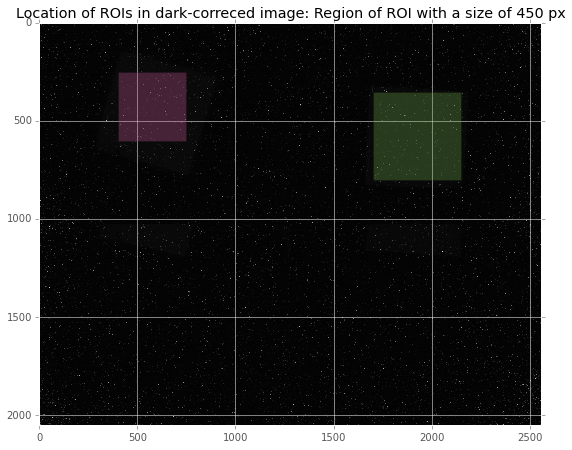

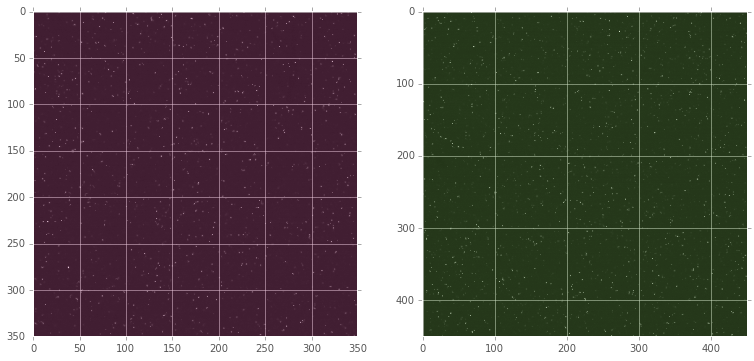

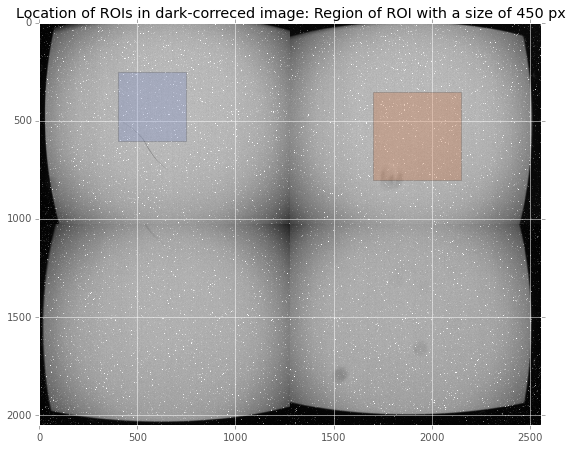

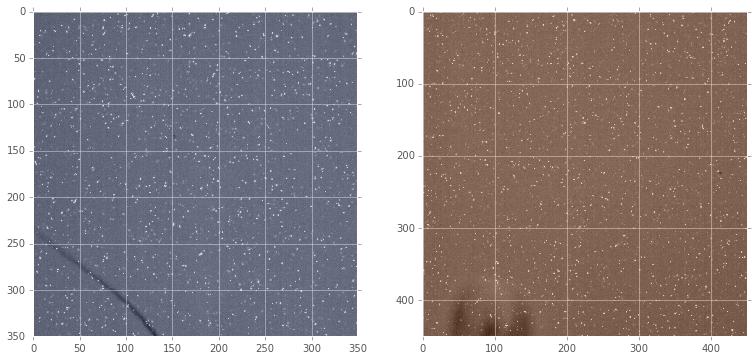

For 1460728608_gkt_gkt2_109_10,
the mean brightness for the ROI of 
	Scintillator 107 is 25.28x brighter on the Toshiba vs. the ISMA scintillator (744 vs. 29, respectively)
	Scintillator 109 is 28.30x brighter on the Toshiba vs. the ISMA scintillator (739 vs. 26, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 0.92x smaller on the Toshiba vs. the ISMA scintillator (30 vs. 27, respectively)
	Scintillator 109 is 0.98x smaller on the Toshiba vs. the ISMA scintillator (29 vs. 29, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728654_gkt_gkt2_46_2


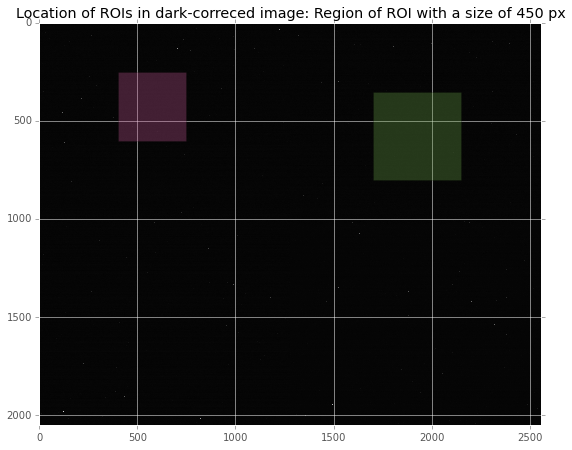

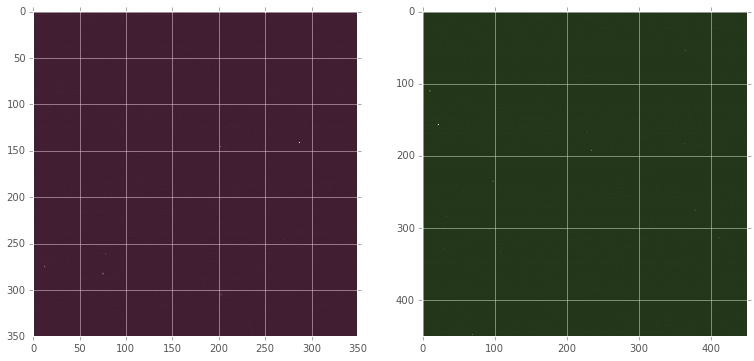

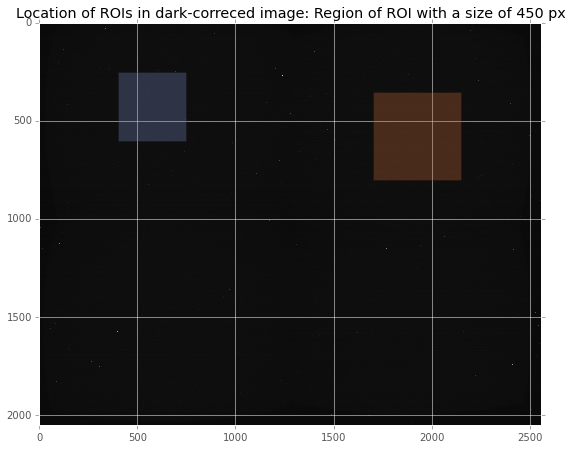

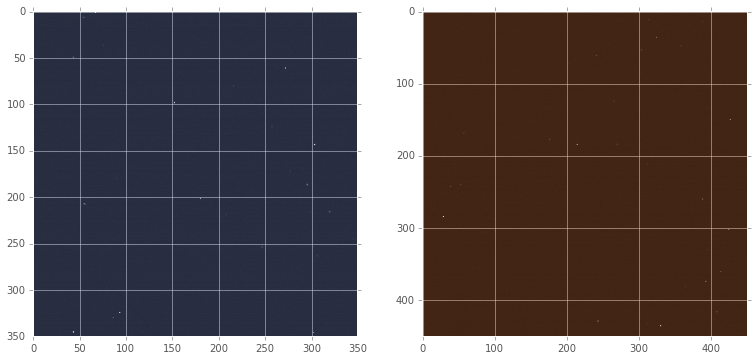

For 1460728654_gkt_gkt2_46_2,
the mean brightness for the ROI of 
	Scintillator 107 is 20.18x brighter on the Toshiba vs. the ISMA scintillator (12 vs. 1, respectively)
	Scintillator 109 is 15.10x brighter on the Toshiba vs. the ISMA scintillator (12 vs. 1, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 0.84x smaller on the Toshiba vs. the ISMA scintillator (4 vs. 4, respectively)
	Scintillator 109 is 0.82x smaller on the Toshiba vs. the ISMA scintillator (4 vs. 3, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728699_gkt_gkt2_46_2


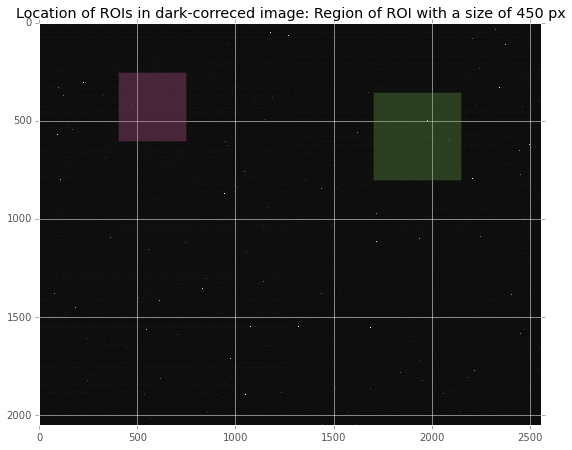

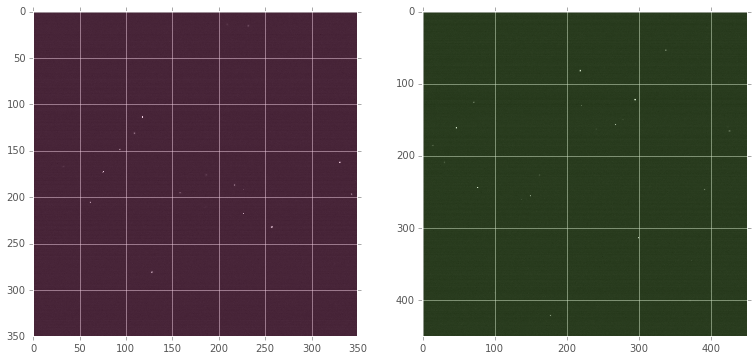

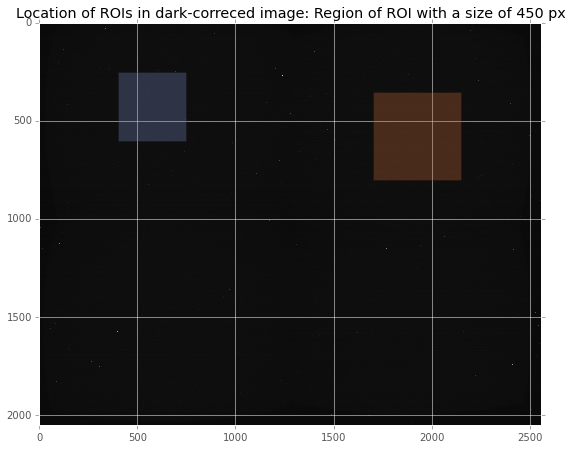

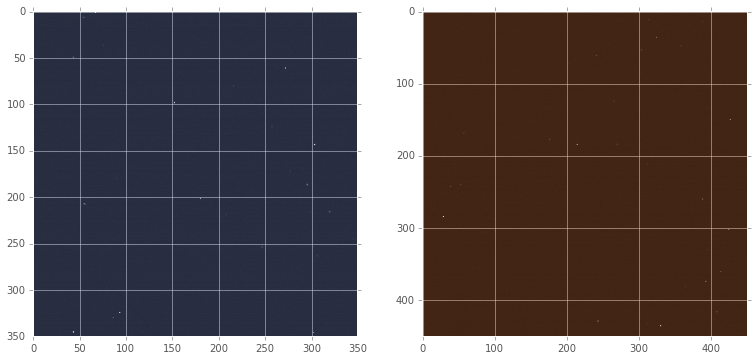

For 1460728699_gkt_gkt2_46_2,
the mean brightness for the ROI of 
	Scintillator 107 is 5.96x brighter on the Toshiba vs. the ISMA scintillator (12 vs. 2, respectively)
	Scintillator 109 is 4.10x brighter on the Toshiba vs. the ISMA scintillator (12 vs. 3, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 2.76x smaller on the Toshiba vs. the ISMA scintillator (4 vs. 12, respectively)
	Scintillator 109 is 2.77x smaller on the Toshiba vs. the ISMA scintillator (4 vs. 10, respectively)
--------------------------------------------------------------------------------
Reading ROIs from folder 1460728735_gkt_gkt2_46_4


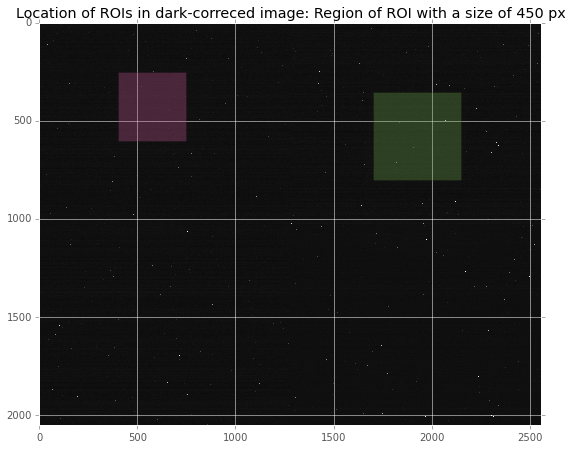

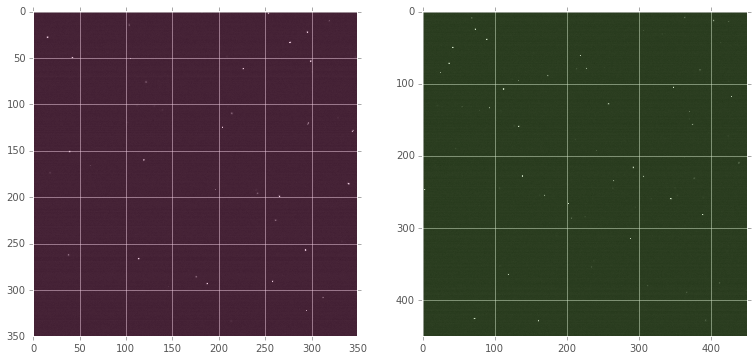

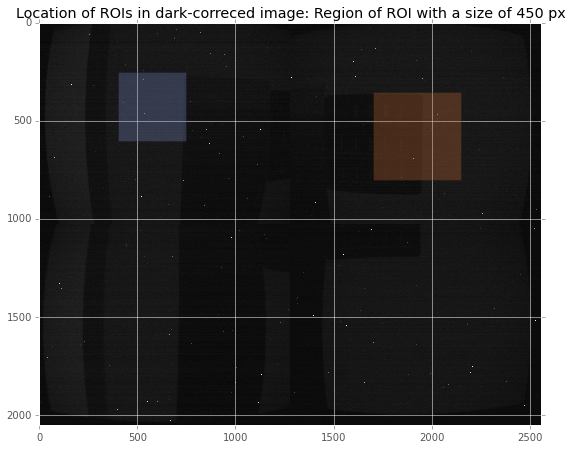

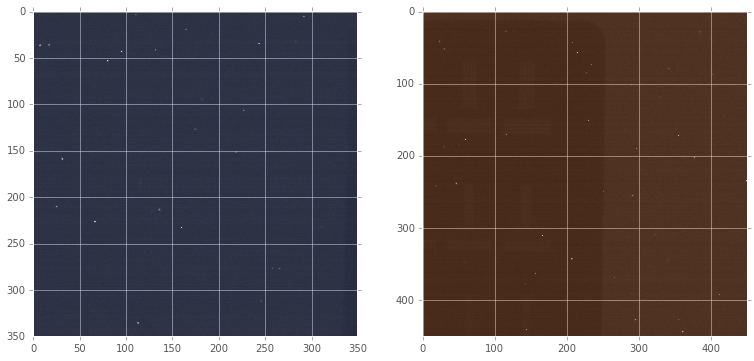

For 1460728735_gkt_gkt2_46_4,
the mean brightness for the ROI of 
	Scintillator 107 is 14.30x brighter on the Toshiba vs. the ISMA scintillator (53 vs. 4, respectively)
	Scintillator 109 is 5.81x brighter on the Toshiba vs. the ISMA scintillator (33 vs. 6, respectively)
the gray value standard deviation for the ROI of 
	Scintillator 107 is 1.17x smaller on the Toshiba vs. the ISMA scintillator (14 vs. 16, respectively)
	Scintillator 109 is 0.63x smaller on the Toshiba vs. the ISMA scintillator (24 vs. 15, respectively)


In [6]:
# Display ROI for different scintillators

# Scintillator Locations
#------------
#| 107  109 |
#|          |
#------------
GektinImages = [None] * len(Folders)
ToshibaImages = [None] * len(Folders)
Names = ['107', '109']
ROIs = [(400,250,350), (1700,350,450)]

GektinMean107 = [None] * len(Folders)
GektinMean109 = [None] * len(Folders)
ToshibaMean107 = [None] * len(Folders)
ToshibaMean109 = [None] * len(Folders)
GektinSTD107 = [None] * len(Folders)
GektinSTD109 = [None] * len(Folders)
ToshibaSTD107 = [None] * len(Folders)
ToshibaSTD109 = [None] * len(Folders)

for c, folder in enumerate(Folders):
    print 80 * '-'
    # Initialize empty variables
    GektinImages[c] = [None] * 3
    ToshibaImages[c] = [None] * 3
    print 'Reading ROIs from folder %s' % os.path.basename(folder)
    for i in range(len(Names)):
        GektinImages[c][i] = display_roi(gkt_Corrected[c], ROIs[i][0], ROIs[i][1], ROIs[i][2], colors[i],
                                         'Location of ROIs in dark-correced image')
        if i == len(Names) - 1:
            plt.show()
    for i in range(len(Names)):
        plt.subplot(1,len(Names),i+1)
        plt.imshow(GektinImages[c][i])
        currentAxis = plt.gca()
        currentAxis.add_patch(Rectangle((0, 0), ROIs[i][2], ROIs[i][2], fc=colors[i], alpha=0.309))
    plt.show()
        
    for i in range(len(Names)):
        ToshibaImages[c][i] = display_roi(sct_Corrected[c], ROIs[i][0], ROIs[i][1], ROIs[i][2], colors[i+len(Names)],
                                          'Location of ROIs in dark-correced image')
        if i == len(Names) - 1:
            plt.show()
    for i in range(len(Names)):
        plt.subplot(1,len(Names),i+1)
        plt.imshow(ToshibaImages[c][i])
        currentAxis = plt.gca()
        currentAxis.add_patch(Rectangle((0, 0), ROIs[i][2], ROIs[i][2], fc=colors[i+len(Names)], alpha=0.309))
    plt.show()            

    print 'For %s,' % os.path.basename(folder)
    # Give out brightness differences
    print 'the mean brightness for the ROI of '
    GektinMean107[c] = numpy.mean(GektinImages[c][0])    
    GektinMean109[c] = numpy.mean(GektinImages[c][1])
      
    ToshibaMean107[c] = numpy.mean(ToshibaImages[c][0])    
    ToshibaMean109[c] = numpy.mean(ToshibaImages[c][1])    
    for i in range(len(Names)):
        print '\tScintillator %s is' % Names[i],
        print '%0.2fx brighter on the Toshiba' % (numpy.mean(ToshibaImages[c][i])/numpy.mean(GektinImages[c][i])),
        print 'vs. the ISMA scintillator (%0.f vs. %0.f, respectively)' % (numpy.mean(ToshibaImages[c][i]),
                                                                            numpy.mean(GektinImages[c][i]))
    
    # STD
    print 'the gray value standard deviation for the ROI of '
    for i in range(len(Names)):
        GektinSTD107[c] = numpy.std(GektinImages[c][0])    
        GektinSTD109[c] = numpy.std(GektinImages[c][1])
      
        ToshibaSTD107[c] = numpy.std(ToshibaImages[c][0])    
        ToshibaSTD109[c] = numpy.std(ToshibaImages[c][1])    
        print '\tScintillator %s is' % Names[i],
        print '%0.2fx smaller on the Toshiba' % (numpy.std(GektinImages[c][i])/numpy.std(ToshibaImages[c][i])),
        print 'vs. the ISMA scintillator (%0.f vs. %0.f, respectively)' % (numpy.std(ToshibaImages[c][i]),
                                                                            numpy.std(GektinImages[c][i]))        

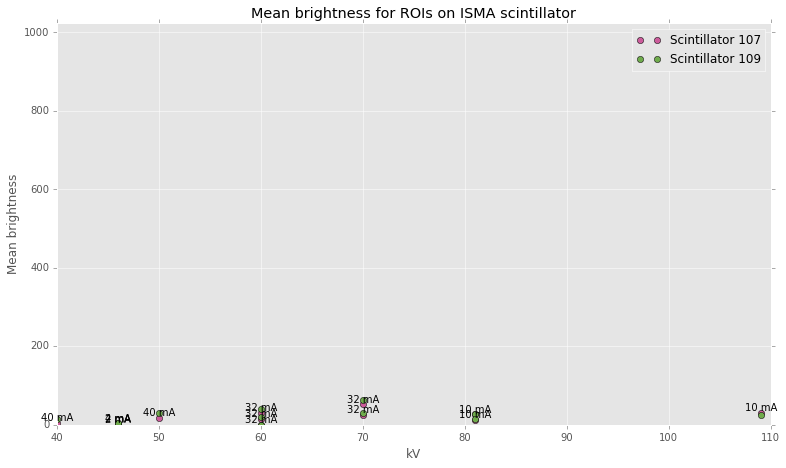

In [7]:
plt.plot(kV, GektinMean107, label='Scintillator 107', ls='', color=colors[0])
for i,j,k in zip(kV,GektinMean107,mA):
    plt.gca().text(i, j, '%s mA' % k, va='bottom', ha='center')
plt.plot(kV, GektinMean109, label='Scintillator 109', ls='', color=colors[1])
plt.legend(loc='best')
plt.xlabel('kV')
plt.ylabel('Mean brightness')
plt.ylim([0,1024])
plt.title('Mean brightness for ROIs on ISMA scintillator')
plt.show()

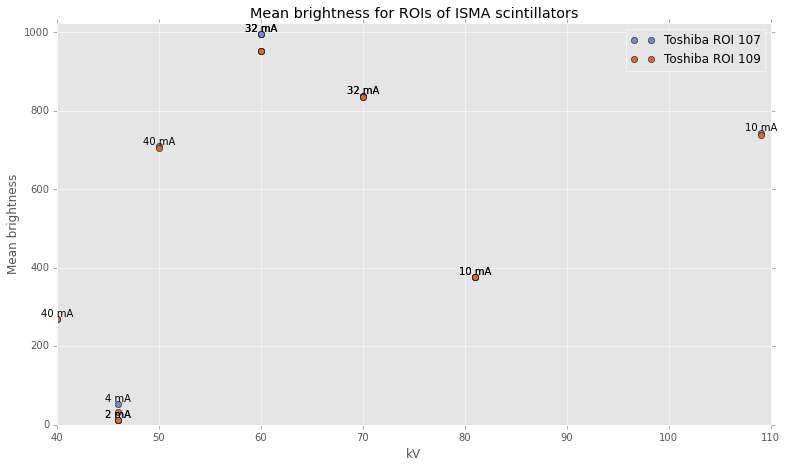

In [8]:
plt.plot(kV, ToshibaMean107, label='Toshiba ROI 107', ls='', color=colors[2])
for i,j,k in zip(kV,ToshibaMean107,mA):
    plt.gca().text(i, j, '%s mA' % k, va='bottom', ha='center')
plt.plot(kV, ToshibaMean109, label='Toshiba ROI 109', ls='', color=colors[3])
plt.legend(loc='best')
plt.xlabel('kV')
plt.ylabel('Mean brightness')
plt.ylim([0,1024])
plt.title('Mean brightness for ROIs of ISMA scintillators')
plt.show()

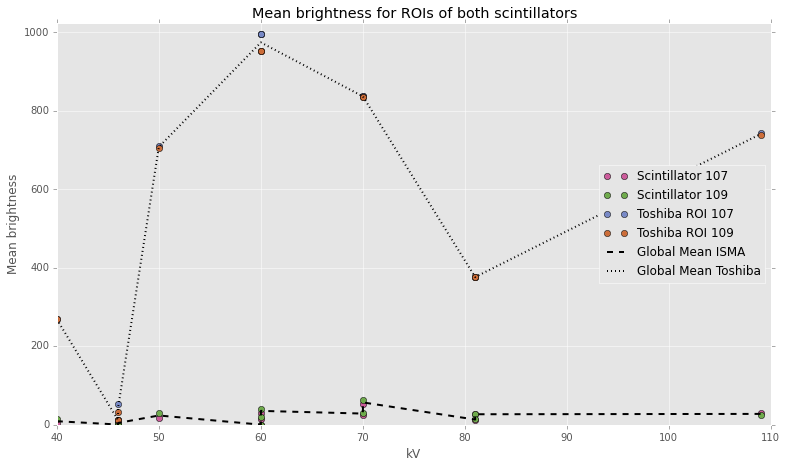

In [9]:
plt.plot(kV, GektinMean107, label='Scintillator 107', ls='', color=colors[0])
plt.plot(kV, GektinMean109, label='Scintillator 109', ls='', color=colors[1])
plt.plot(kV, ToshibaMean107, label='Toshiba ROI 107', ls='', color=colors[2])
plt.plot(kV, ToshibaMean109, label='Toshiba ROI 109', ls='', color=colors[3])

# sort global mean list on KV, so that we can plot the global mean line
# http://stackoverflow.com/a/6618543/323100
plt.plot(sorted(kV), [x for (y,x) in sorted(zip(kV,[numpy.mean(k) for k in zip(GektinMean107, GektinMean109)]))],
         ls='dashed', c='k', marker='', label='Global Mean ISMA')
plt.plot(sorted(kV), [x for (y,x) in sorted(zip(kV,[numpy.mean(k) for k in zip(ToshibaMean107, ToshibaMean109)]))],
         ls='dotted', c='k', marker='', label='Global Mean Toshiba')
plt.legend(loc='best')
plt.xlabel('kV')
plt.ylabel('Mean brightness')
plt.ylim([0,1024])
plt.title('Mean brightness for ROIs of both scintillators')
plt.show()